# Why does QeMCMC work?

****UNFINISHED**

The first question that many people ask when confronted with QeMCMC, is some variant of 

**"why does the suggested quantum circuit result in good MCMC proposals?"**

In this notebook, we attempt to provide the answer, with some simple numerics. Note, that "Quantum enhanced Markov chains require fine-tuned quenches" by Alev Orfi and Dries Sels is an excelent starting point if you wish to go more in depth on this subject.

## Imports

In [1]:
import numpy as np
from matplotlib import pyplot as plt
from joblib import Parallel, delayed

# Internal imports from QeMCMC package

# sampler contains the classical and quantum enhanced MCMC sampler
from qemcmc.sampler import ClassicalProposal, QeProposal
from qemcmc.sampler.runners import MCMCRunner

# These are object useful to store the results of the MCMC simulation
from qemcmc.utils import plot_chains

# This helps you build an example Ising model
from qemcmc.model import EnergyModel, ModelMaker



# Define model problem N = 2

Instead of definining a spin glass ising model, lets define a very small, more understandable model.

Let take the csimple case of two qubits, where the four basis states represent qubo configurations of energy:

E(00) = 0
E(01) = 10
E(10) = 10
E(11) = 0

Which can be represented by the cost function, where b represents the bit string:

$$ E(b) = 10\times(b_0 (b_1 \oplus 1) + 10\times((b_0 \oplus 1)b_1) $$

In other words, 

    if b[0] = 1:
        if b[1]= 0:
            E = 10
        else:
            E = 0
    else:
        if b[1] = 1:
            E = 10
        else:
            E = 0

This can be mapped to the simple 2x2 coupling for a binary energy model:

$\begin{array}{c} Q = \begin{pmatrix}
-20 & 20 \\
20 & -20
\end{pmatrix} \end{array}$



In [3]:

# Define parameters
n = 2 # Number of spins in the system

# Build a very simple model
manual_coupling = np.array([[-20, 20], [20, -20]]) # Coupling matrix for the Ising model
model = EnergyModel(n, couplings=[manual_coupling], name ="manual coupling model", model_type = "binary")



State: [0,0], Energy: 0.0
State: [0,1], Energy: 10.0
State: [1,0], Energy: 10.0
State: [1,1], Energy: 0.0


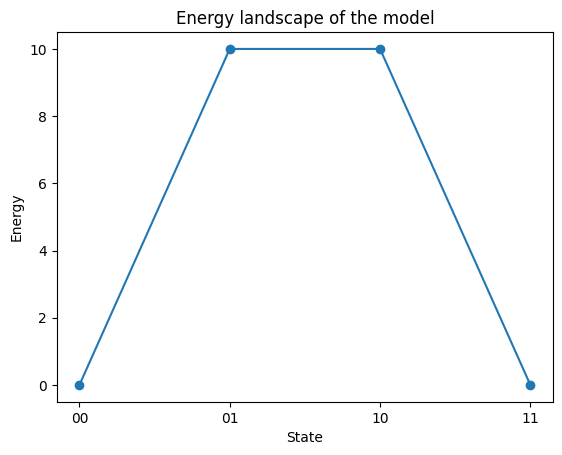

In [4]:
# Checking that the model returns the expected energies for each state
print("State: [0,0], Energy:", model.get_energy("00"))
print("State: [0,1], Energy:", model.get_energy("01"))
print("State: [1,0], Energy:", model.get_energy("10"))
print("State: [1,1], Energy:", model.get_energy("11"))

plt.title("Energy landscape of the model")
plt.plot([0,1,2,3], [model.get_energy("00"), model.get_energy("01"), model.get_energy("10"), model.get_energy("11")], "o-")
plt.xlabel("State")
plt.ylabel("Energy")
plt.xticks([0,1,2,3], ["00", "01", "10", "11"])
plt.show()



### High Temperature
Lets specify that the algorithm must start in the state 00, and write down some other hyperparameters

In [5]:
initial_state = "00"
temp = 1000 # Temperature of the system





reps = 1 # How many markov chains to produce
steps = 10 # Length of each markov chain

# QeMCMC parameters
gamma = (0.3,0.6)# Relative strength of mixer hamiltonian 
time = (1,10) # Time for hamiltonian simulation



### Run classical MCMC

In [6]:

runner = MCMCRunner(model, temp)

loc_chains = []
for rep in range(reps):
    classical_local_proposal = ClassicalProposal(model=model, method = "local")
    loc_chain = runner.run(classical_local_proposal, steps, initial_state = initial_state, name = "classical local MCMC", verbose = False, sample_frequency = 1)
    loc_chains.append(loc_chain)




### Run quantum MCMC

In [7]:
# Run the quantum algorithm
# The QeMCMC class is very similar to the MCMC class, but it has a few extra parameters that are specific to the quantum algorithm. 
# gamma and time are the hyperparameters that might need tuned for your specific problem.
# This may take a minute or so to run, depending on the number of steps and the size of the system. 

def run_qemcmc(rep):
    quantum_proposal = QeProposal(model, gamma=gamma, time=time)
    return runner.run(quantum_proposal, steps, initial_state=initial_state, name="QeMCMC", verbose=True, sample_frequency=1)

# Run in parallel as they can take a while.
Qe_chains = Parallel(n_jobs=-1)(delayed(run_qemcmc)(rep) for rep in range(reps))
    

### Analysis

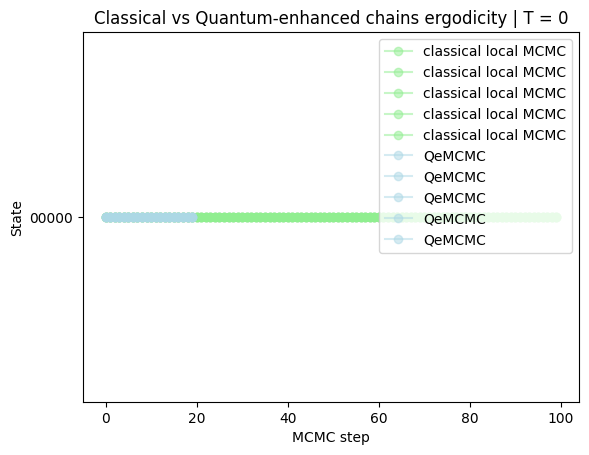

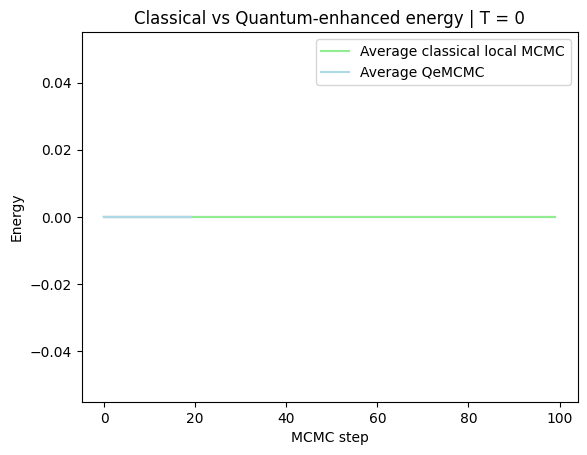

In [43]:

# Plot the list of chains with a helper function
# Dark line is for average ove rchains, transparent lines are for each individual chains

for chain in loc_chains:
    states = chain.accepted_states
    steps = np.arange(len(states))
    plt.plot(steps, states, "o-", label="classical local MCMC", color="lightgreen", alpha=0.5)

for chain in Qe_chains:
    states = chain.accepted_states
    steps = np.arange(len(states))
    plt.plot(steps, states, "o-", label="QeMCMC", color="lightblue", alpha=0.5)

plt.title("Classical vs Quantum-enhanced chains ergodicity | T = {}".format(temp))
plt.ylabel("State")
plt.legend()

plt.xlabel("MCMC step")
plt.show()

plot_chains(loc_chains, "lightgreen", "classical local MCMC")
plot_chains(Qe_chains, "lightblue", "QeMCMC")


plt.xlabel("MCMC step")
plt.ylabel("Energy")
plt.title("Classical vs Quantum-enhanced energy | T = {}".format(temp))
plt.legend()
plt.show()

Hopefully from the above, you can see that both classical and quantum-enhanced chains can get from any state to any other state. 


## Low temperature
For low temperatures however the local method cannot do this. For T = 0, it is trivially **non-ergdic**, it cannot travel from 00 to 11 without first increasing in energy to 01 or 10. This is exponentially unlikely to be accepted by the Metropolis Hastings criteria.

In [12]:

temp = 0
steps = 20 # Length of each markov chain


In [13]:

runner = MCMCRunner(model, temp)

loc_chains = []
for rep in range(reps):
    classical_local_proposal = ClassicalProposal(model=model, method = "local")
    loc_chain = runner.run(classical_local_proposal, steps, initial_state = initial_state, name = "classical local MCMC", verbose = False, sample_frequency = 1)
    loc_chains.append(loc_chain)




In [14]:
# Run the quantum algorithm

def run_qemcmc(rep):
    quantum_proposal = QeProposal(model, gamma=gamma, time=time)
    return runner.run(quantum_proposal, steps, initial_state=initial_state, name="QeMCMC", verbose=True, sample_frequency=1)

# Run in parallel as they can take a while.
Qe_chains = Parallel(n_jobs=-1)(delayed(run_qemcmc)(rep) for rep in range(reps))
    

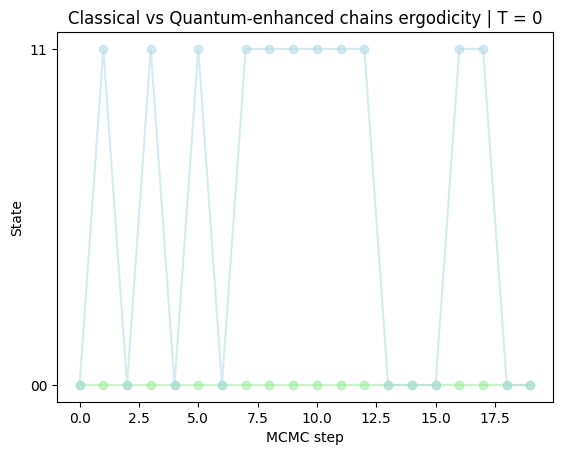

In [18]:
# Plot the list of chains with a helper function
for chain in loc_chains:
    states = chain.accepted_states
    steps = np.arange(len(states))
    plt.plot(steps, states, "o-", label="classical local MCMC", color="lightgreen", alpha=0.5)

for chain in Qe_chains:
    states = chain.accepted_states
    steps = np.arange(len(states))
    plt.plot(steps, states, "o-", label="QeMCMC", color="lightblue", alpha=0.5)

plt.title("Classical vs Quantum-enhanced chains ergodicity | T = {}".format(temp))
plt.ylabel("State")
plt.xlabel("MCMC step")
plt.show()



The classical proposal has no ability to jump straight from 00 to 11, so it just gets stuck in 00. The quantum move however, can traverse directly from 00 to 11. This is related to the traditional "tunneling" description of quantum advantage in search problems. 

The above is, of course, no proof of quantum advantage as a uniform classical proposal would be able to traverse this gap. Lets increase the size of the system, such that the uniform proposal is very unlikely to find the perfect jump.



# Larger system, N = 5

Lets build a similar energy model, but for a slightly larger system of 5 bits. In this case, a uniform proposal would, on average take $O(2^n)$ samples to find the 11111 state, when starting from 00000.

In [135]:
n = 5 # Number of spins in the system

# Build a very simple model
manual_coupling = 2*np.ones((n, n)) - 2*np.eye(n) # Coupling matrix for the Ising model
manual_field = -3.99*np.ones(n) # Field for the Ising model
model = EnergyModel(n, couplings=[ manual_field, manual_coupling], name ="manual coupling model", model_type = "binary")
initial_state = "0"*n

gamma = 0.5
time = (1,10)

Here we check that the energy model is roughly what we wanted, with two well seperated local minima. The 11111 state is designed to have a slightly lower energy.

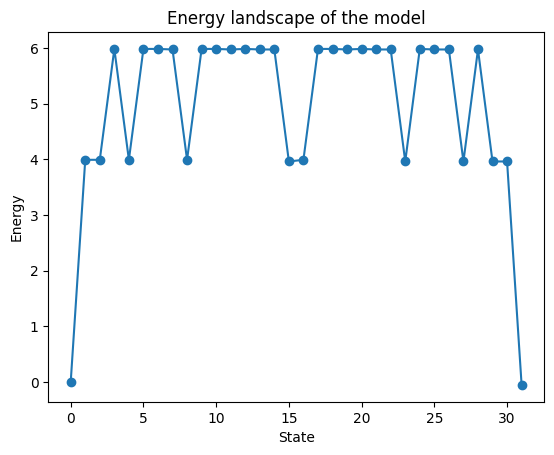

Energy of first state (should be 0): 0.0
Energy of last state (should be -0.5): -0.04999999999999716
state int:  0
State: 00000, Classical Energy: 0.0, Quantum Hamiltonian Energy: -8.881784197001252e-16
state int:  31
State: 11111, Classical Energy: -0.04999999999999716, Quantum Hamiltonian Energy: 0.049999999999998046


In [136]:
plt.title("Energy landscape of the model")
state_ints = list(range(2**n))
all_states = ["".join([str(int(x)) for x in bin(state)[2:].zfill(n)]) for state in state_ints]
energies = [model.get_energy(state) for state in all_states]

plt.plot(state_ints, energies, "o-")    
plt.xlabel("State")
plt.ylabel("Energy")
plt.show()

# check our model problem is as expected, we should have two states with energy 0 and the rest should have energy >= 39.9
print("Energy of first state (should be 0):", energies[0])
print("Energy of last state (should be -0.5):", energies[-1])

# Also check the Hamiltonian is being constructed correctly in the quantum proposal, this will check that the energies of the first and last state are correct, if these dont match then the quantum algorithm won't be simulating the correct problem.
quantum_proposal = QeProposal(model, gamma=gamma, time=time)
quantum_proposal.CM.check_Hamiltonian([0,2**n-1], model.couplings)



In [137]:
steps = 100 # Length of each markov chain
temp = 0
reps = 5

In [138]:

runner = MCMCRunner(model, temp)

loc_chains = []
for rep in range(reps):
    classical_local_proposal = ClassicalProposal(model=model, method = "local")
    loc_chain = runner.run(classical_local_proposal, steps, initial_state = initial_state, name = "classical local MCMC", verbose = False, sample_frequency = 1)
    loc_chains.append(loc_chain)

uni_chains = []
for rep in range(reps):
    classical_uniform_proposal = ClassicalProposal(model=model, method = "uniform")
    uni_chain = runner.run(classical_uniform_proposal, steps, initial_state = initial_state, name = "classical uniform MCMC", verbose = False, sample_frequency = 1)
    uni_chains.append(uni_chain)


    

In [139]:

# Run the quantum algorithm
steps = 20 # Length of each markov chain

def run_qemcmc(rep):
    quantum_proposal = QeProposal(model, gamma=gamma, time=time)
    return runner.run(quantum_proposal, steps, initial_state=initial_state, name="QeMCMC", verbose=True, sample_frequency=1)

# Run in parallel as they can take a while.
Qe_chains = Parallel(n_jobs=-1)(delayed(run_qemcmc)(rep) for rep in range(reps))

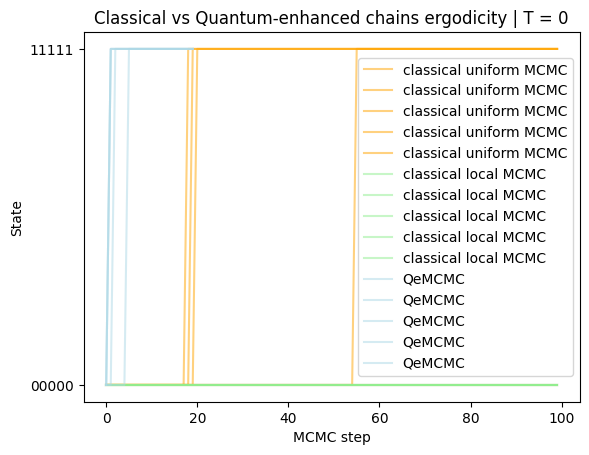

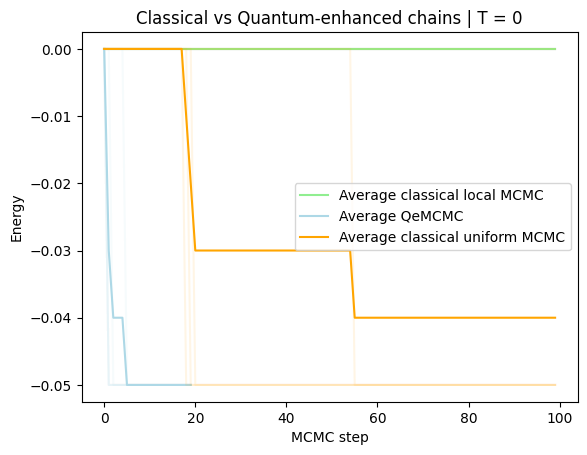

In [140]:
for chain in uni_chains:
    states = chain.accepted_states
    steps = np.arange(len(states))
    plt.plot(steps, states, "-", label="classical uniform MCMC", color="orange", alpha=0.5)

for chain in loc_chains:
    states = chain.accepted_states
    steps = np.arange(len(states))
    plt.plot(steps, states, "-", label="classical local MCMC", color="lightgreen", alpha=0.5)

for chain in Qe_chains:
    states = chain.accepted_states
    steps = np.arange(len(states))
    plt.plot(steps, states, "-", label="QeMCMC", color="lightblue", alpha=0.5)




plt.title("Classical vs Quantum-enhanced chains ergodicity | T = {}".format(temp))
plt.ylabel("State")
plt.xlabel("MCMC step")
plt.legend()
plt.show()

plot_chains(loc_chains, "lightgreen", "classical local MCMC")
plot_chains(Qe_chains, "lightblue", "QeMCMC")
plot_chains(uni_chains, "orange", "classical uniform MCMC")

plt.xlabel("MCMC step")
plt.ylabel("Energy")
plt.title("Classical vs Quantum-enhanced chains | T = {}".format(temp))
plt.legend()
plt.show()

Hopefully you should see that the uniform and quantum-enhanced proposals can both find the minima, while the local in not-ergodic. The quantum-enhanced method is also much more efficient in crossing the region of high energy.

# Qe Proposal in-depth

So, now that we are satified that the quantum-enhanced proposals do find "distant" configurations that are of "similar energy", lets try to understand what the time-evolution unitary described by Layden et al. is doing, and why they choice their Hamiltonian to be (some variant of):

$H = H_p + \gamma H_{mix}$

where $H_{mix} = \sum_i X_i$ and $H_p$ encodes the problem energy function.

### Define some helper functions
The first returns the statevector of a quanutm simulation, while the second plots an animation of the amplitudes.

In [169]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML


def run_qemcmc_amplitude(t, model, coupling_weights, initial_state, mixing_gamma):
    quantum_proposal = QeProposal(model, gamma=mixing_gamma, time=t)
    dt = 0.8
    if t < 2*dt:
        dt = t/2
        r = 2
    else:
        r = int(t/dt)
        dt = t/r
    state_vector = quantum_proposal.CM.get_state_vector(initial_state, coupling_weights, t, r, mixing_gamma)
    return state_vector


def plot_anim(energies, amplitude_array, times):
    # Setup the figure and the primary axis (LHS for Energy)
    fig, ax_en = plt.subplots()
    ax_amp = ax_en.twinx()  # Create RHS axis for Amplitudes

    # Initialize lines
    line_energy, = ax_en.plot([], [], "s--", label="Energy", color="green", alpha=0.4)
    line_real, = ax_amp.plot([], [], "o-", label="Real amplitude", color="blue", markersize=4)
    line_imag, = ax_amp.plot([], [], "o-", label="Imaginary amplitude", color="orange", markersize=4)
    line_prob, = ax_amp.plot([], [], "o-", label="Probability", color="purple", markersize=4)

    # Axis formatting: LHS (Energy)
    ax_en.set_xlabel("State")
    ax_en.set_ylabel("Energy", color="green")
    ax_en.tick_params(axis='y', labelcolor="green")
    ax_en.set_ylim(np.min(energies) - 0.5, np.max(energies) + 0.5)
    ax_en.set_xlim(0, len(energies))


    # Axis formatting: RHS (Amplitude)
    ax_amp.set_ylabel("Amplitude", color="blue")
    ax_amp.tick_params(axis='y', labelcolor="blue")
    ax_amp.set_ylim(-1.1, 1.1)  # Amplitudes are bounded by [-1, 1]
    ax_amp.set_xlim(0, len(energies))
    ax_amp.axhline(0, color='black', lw=0.5, ls='--') # Zero reference

    # Combined legend handling
    lines = [line_energy, line_real, line_imag, line_prob]
    labels = [l.get_label() for l in lines]
    ax_en.legend(lines, labels, loc='upper right')

    def init():
        line_energy.set_data([], [])
        line_real.set_data([], [])
        line_imag.set_data([], [])
        line_prob.set_data([], [])
        return line_energy, line_real, line_imag, line_prob

    def update(frame):
        # Energy is often static, but indexed here for time-dependent cases
        en_data = energies
        line_energy.set_data(state_ints, en_data)
        
        # Update complex amplitudes
        line_real.set_data(state_ints, amplitude_array[frame].real)
        line_imag.set_data(state_ints, amplitude_array[frame].imag)
        line_prob.set_data(state_ints, np.abs(amplitude_array[frame])**2)
        
        ax_en.set_title(f"Quantum State Evolution | t = {times[frame]:.3f}")
        return line_energy, line_real, line_imag

    # Animation configuration
    anim = FuncAnimation(
        fig, update, frames=len(times), init_func=init, blit=True, interval=80
    )

    plt.close()
    return HTML(anim.to_jshtml())


### $\gamma = 0$

Firstly, what happens if we ignore the mixing term in our Hamiltonian? What does it mean to do time evolution under the problem Hamiltonian? $H_p$ consists of only Z terms, meaning that there are no non-commuting terms in the overall Hamiltonian. When we start in a computational Basis state, x, this results in the Time Evolution propogator simply causing oscillations according to:

$$e^{-itH_p}|x> = e^{-itE_p(x)}|x>$$


In [142]:

problem_weight = 1
mixing_gamma = 0
coupling_weights = (problem_weight*np.ones(len(model.couplings)))
state_ints = list(range(2**n))
print("coupling_weights:", coupling_weights)

times = np.linspace(0.1,10,30)#np.logspace(-1, 2, 300)
amplitude_array = np.zeros((len(times), len(state_ints)), dtype = np.complex128)


for i, t in enumerate(times):
    state_vector = run_qemcmc_amplitude(t, model, coupling_weights, initial_state, mixing_gamma)  

    amplitude_array[i,:] = state_vector

coupling_weights: [1. 1.]


In [143]:

all_states = ["".join([str(int(x)) for x in bin(state)[2:].zfill(n)]) for state in state_ints]
energies = [model.get_energy(state) for state in all_states]
colors = plt.cm.viridis(np.linspace(0, 1, len(times)))
probabilities_array = np.abs(amplitude_array) ** 2
# plot energies on a different y axis, on the lhs


# for i, probabilities in enumerate(probabilities_array):
#     plt.plot(state_ints, probabilities, "o-", color=colors[i], alpha=0.1, )
# plt.legend()
# plt.ylabel("Probability")
# plt.legend(loc="upper right")
# plt.xlabel("State")
# plt.title("Probability distribution from quantum proposal after t = {}".format(times[-1]))

# plt.twinx()
# plt.plot(state_ints, energies, "o-", color="grey", label="Energy", alpha = 0.1)


# plt.ylabel("Energy")
# plt.show()


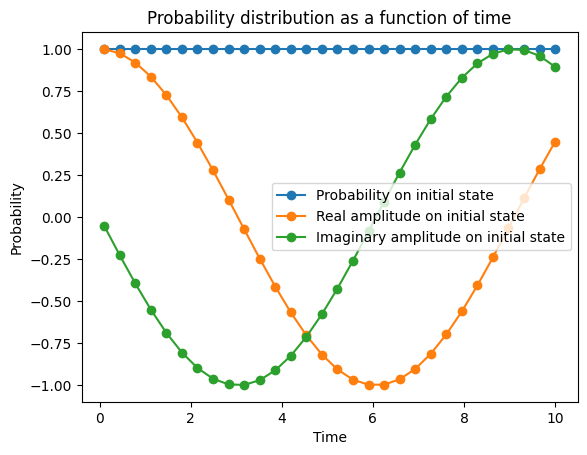

In [144]:
prob_on_last_state = probabilities_array[:,-1]
prob_on_first_state = probabilities_array[:,0]
plt.plot(times, prob_on_first_state, "o-", label="Probability on initial state")

plt.plot(times, amplitude_array[:, 0].real, "o-", label="Real amplitude on initial state")
plt.plot(times, amplitude_array[:, 0].imag, "o-", label="Imaginary amplitude on initial state")


plt.xlabel("Time")
plt.ylabel("Probability")
plt.title("Probability distribution as a function of time")
plt.legend()
plt.show()

In [147]:
plot_anim(energies, amplitude_array, times)


You should see the probability on the initial state remaining at 1, and the phase of the amplitude oscillating between real and imaginary.

### $H = H_{mix}$

What happens if we do the opposite, and ignore the problem term, and just have pure mixing? Naturally, the system should mix fully after some time.

In [177]:

problem_weight = 0
mixing_gamma = 1
coupling_weights = (problem_weight*np.ones(len(model.couplings))) / mixing_gamma
state_ints = list(range(2**n))
times = np.linspace(0.1,10,30)#np.logspace(-1, 2, 300)
no_problem_amplitude_array = np.zeros((len(times), len(state_ints)), dtype = np.complex128)


for i, t in enumerate(times):
    state_vector = run_qemcmc_amplitude(t, model, coupling_weights, initial_state, mixing_gamma)  

    no_problem_amplitude_array[i,:] = state_vector

In [178]:
plot_anim(energies, no_problem_amplitude_array, times)


Again, we see highly oscillatory behaviour but now the probability amplitude is being spread among the basis states and oscillating between either extreme of the state space. Lets just analyse this behaviour some more:

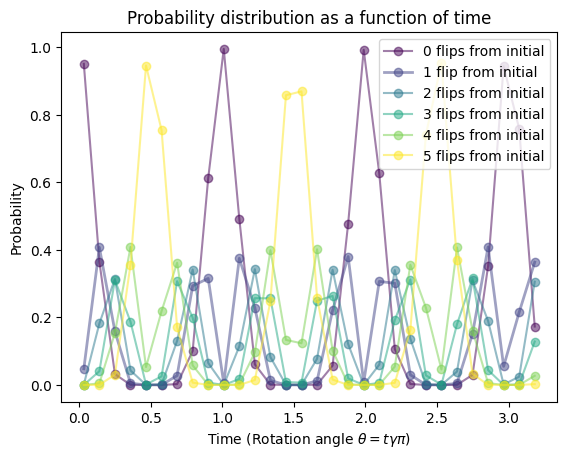

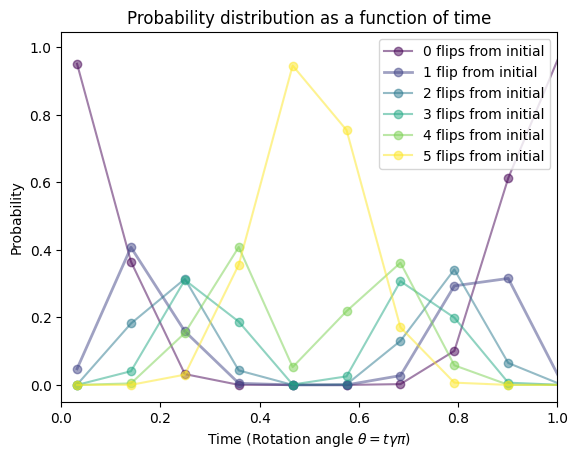

In [150]:
no_problem_probabilities_array = np.abs(no_problem_amplitude_array) ** 2
prob_on_last_state = no_problem_probabilities_array[:,-1]
prob_on_first_state = no_problem_probabilities_array[:,0]


times_radians = times / np.pi

colors = plt.cm.viridis(np.linspace(0, 1, n+1))
for j in range(n+1):
    indexes_j_hamming_away_from_0 = [i for i, state in enumerate(all_states) if sum(int(x) for x in state) == j]
    probability_on_states_j_hamming_away_from_0 = no_problem_probabilities_array[:, indexes_j_hamming_away_from_0].sum(axis=1)
    if j == 1:
         plt.plot(times_radians, probability_on_states_j_hamming_away_from_0, "o-", label="{} flip from initial".format(j), color = colors[j], alpha=0.5, linewidth=2)
    else:
        plt.plot(times_radians, probability_on_states_j_hamming_away_from_0, "o-", label="{} flips from initial".format(j), color = colors[j], alpha=0.5)

plt.xlabel("Time (Rotation angle $\\theta = t \\gamma \\pi$)")
plt.ylabel("Probability")
plt.title("Probability distribution as a function of time")
plt.legend()
plt.show()



colors = plt.cm.viridis(np.linspace(0, 1, n+1))
for j in range(n+1):
    indexes_j_hamming_away_from_0 = [i for i, state in enumerate(all_states) if sum(int(x) for x in state) == j]
    probability_on_states_j_hamming_away_from_0 = no_problem_probabilities_array[:, indexes_j_hamming_away_from_0].sum(axis=1)
    if j == 1:
         plt.plot(times_radians, probability_on_states_j_hamming_away_from_0, "o-", label="{} flip from initial".format(j), color = colors[j], alpha=0.5, linewidth=2)
    else:
        plt.plot(times_radians, probability_on_states_j_hamming_away_from_0, "o-", label="{} flips from initial".format(j), color = colors[j], alpha=0.5)

plt.xlabel("Time (Rotation angle $\\theta = t \\gamma \\pi$)")
plt.ylabel("Probability")
plt.title("Probability distribution as a function of time")
plt.legend()
plt.xlim(0,1)
plt.show()

### $H = H_p + \gamma H_{mix}$

In [197]:
problem_weight = 1
mixing_gamma = 3
coupling_weights = (problem_weight*np.ones(len(model.couplings))) / mixing_gamma
state_ints = list(range(2**n))
times = np.linspace(0.1,20,50)#np.logspace(-1, 2, 300)
no_mixer_amplitude_array = np.zeros((len(times), len(state_ints)), dtype = np.complex128)


for i, t in enumerate(times):
    state_vector = run_qemcmc_amplitude(t, model, coupling_weights, initial_state, mixing_gamma)  
    no_mixer_amplitude_array[i,:] = state_vector

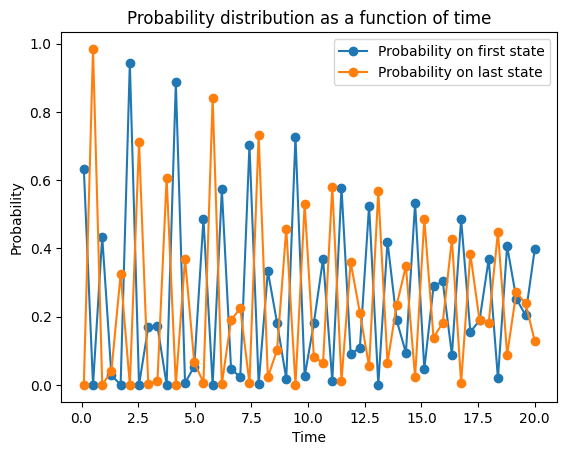

In [198]:

no_mixer_prob_array = np.abs(no_mixer_amplitude_array) ** 2
prob_on_last_state = no_mixer_prob_array[:,-1]
prob_on_first_state = no_mixer_prob_array[:,0]
prob_on_all_other_states = no_mixer_prob_array[:,1:-1].sum(axis=1)

plt.plot(times, prob_on_first_state, "o-", label="Probability on first state")
#plt.plot(times, no_mixer_amplitude_array[:,0].real, "o-", label="Real part of amplitude on first state")
#plt.plot(times, no_mixer_amplitude_array[:,0].imag, "o-", label="Imaginary part of amplitude on first state")



# plt.xlabel("Time")
# plt.ylabel("Probability")
# plt.title("Probability distribution on first state as a function of time")
# plt.legend()
# plt.show()



plt.plot(times, prob_on_last_state, "o-", label="Probability on last state")
#plt.plot(times, no_mixer_amplitude_array[:,-1].real, "o-", label="Real part of amplitude on last state")
#plt.plot(times, no_mixer_amplitude_array[:,-1].imag, "o-", label="Imaginary part of amplitude on last state")


#plt.plot(times, prob_on_all_other_states, "o-", label="Summed probability on all other states")


plt.xlabel("Time")
plt.ylabel("Probability")
plt.title("Probability distribution as a function of time")
plt.legend()
plt.show()




In [199]:
plot_anim(energies, no_mixer_amplitude_array, times)


In [154]:
import numpy as np
from matplotlib import pyplot as plt
from qemcmc.spectralgap import SpectralGap
from tqdm.notebook import tqdm
from qemcmc.sampler import ClassicalProposal, QeProposal
import numpy as np
from qemcmc.model import ModelMaker


In [159]:
from joblib import Parallel, delayed
import numpy as np
from tqdm import tqdm

# Define parameters of experiment
temp = 0.1
n = 5
t_list = np.logspace(-1,2,20)
print("t_list: ", t_list)
# Number of models to test at each n

# Type of model to test
model_type = "Fully Connected Ising"


q_spec_gaps = []


h_list = [0.3,1.01,1.3]#np.logspace(-1, 1, 5)
print("h_list: ", h_list)
# Loop over the number of spins in the system
pbar = tqdm(h_list, desc="Looping through h", bar_format = "{l_bar}|{bar}| {n_fmt}/{total_fmt}{postfix}")
for h in pbar:
    pbar.set_description(f"Currently on h: {h}")

    q_spec_gaps_n = []
   
    # Loop over the number of models to test


    
    
    

    def compute_spec_gap(model, t, h):
        """Encapsulated logic for a single model evaluation."""
        # Logic from your original inner loop
        coupling_weights = [1.0/(1-h) for _ in range(len(model.couplings))]
        
        quantum_proposal = QeProposal(model, gamma=h, time=t, coupling_weights=coupling_weights)
        spec_gap_finder = SpectralGap(quantum_proposal, model)
        
        return spec_gap_finder.find_spectral_gap()
    for t in tqdm(t_list, desc="t loop"):
        # Main execution
        # Run models in parallel for the current t
        gap = compute_spec_gap(model, t, h) 
        

    
        q_spec_gaps_n.append(gap)

    q_spec_gaps.append(q_spec_gaps_n)
    
q_spec_gaps = np.array(q_spec_gaps)


t_list:  [  0.1          0.14384499   0.20691381   0.29763514   0.42813324
   0.61584821   0.88586679   1.27427499   1.83298071   2.6366509
   3.79269019   5.45559478   7.8475997   11.28837892  16.23776739
  23.35721469  33.59818286  48.32930239  69.51927962 100.        ]
h_list:  [0.3, 1.01, 1.3]


t loop: 100%|██████████| 20/20 [00:21<00:00,  1.08s/it]
Currently on h: 1.01:  33%||███▎      | 1/3

t loop: 100%|██████████| 20/20 [00:21<00:00,  1.09s/it]
Currently on h: 1.3:  67%||██████▋   | 2/3 

t loop: 100%|██████████| 20/20 [00:21<00:00,  1.06s/it]
Currently on h: 1.3: 100%||██████████| 3/3


(3, 20)


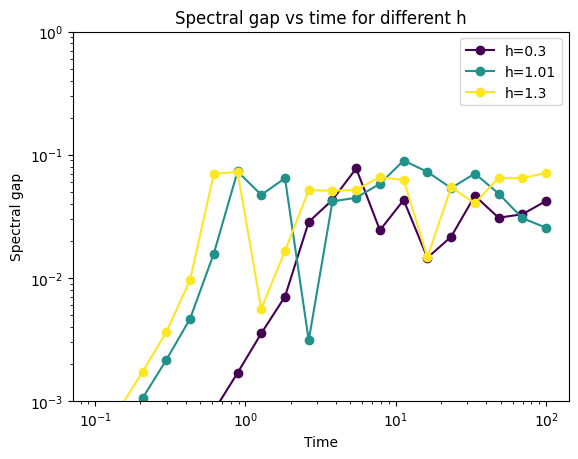

In [160]:
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

print(q_spec_gaps.shape)

color_range = np.linspace(0, 1, q_spec_gaps.shape[0])
for i in range(q_spec_gaps.shape[0]):
    c = plt.cm.viridis(color_range[i])
    plt.plot(t_list, q_spec_gaps[i,:], marker='o', label = f"h={np.round(h_list[i],2)}", color = c)


plt.ylabel("Spectral gap")
plt.xlabel("Time")
plt.title("Spectral gap vs time for different h")
plt.legend()
plt.yscale("log")
plt.xscale("log")
plt.ylim(1e-3, 1)
plt.show()